<a href="https://colab.research.google.com/github/clchinara/art-movement-classifier/blob/main/paintings.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
 !pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 20.4MB/s 
     |████████████████████████████████| 1.2MB 48.2MB/s 
     |████████████████████████████████| 51kB 5.8MB/s 
     |████████████████████████████████| 194kB 41.8MB/s 
     |████████████████████████████████| 51kB 6.1MB/s 
     |████████████████████████████████| 61kB 6.8MB/s 
     |████████████████████████████████| 776.8MB 22kB/s 
     |████████████████████████████████| 12.8MB 40.6MB/s 
ERROR: torchtext 0.9.1 has requirement torch==1.8.1, but you'll have torch 1.7.1 which is incompatible.
Mounted at /content/gdrive


In [ ]:
from fastbook import *
from fastai.vision.widgets import *

In [ ]:
import os

In [ ]:
# Bing Search API
key = os.environ.get('AZURE_SEARCH_KEY', 'YOUR_API_KEY')

In [ ]:
# The search function
search_images_bing

<function fastbook.search_images_bing>

# Art Movement and Style Classifier
This classification model will discriminate a painting's art style among these four categories: \
1) Cubism \
2) Pointilism \
3) Rococo \
4) Impressionism \


## 1. Creating the image dataset

In [ ]:
painting_styles = 'cubism', 'pointilism', 'rococo', 'impressionism'
path = Path('paintings')

In [ ]:
path.exists()

True

In [ ]:
# Create directory for each category
if not path.exists():
  path.mkdir()
  for i in painting_styles:
    dest = (path/i)
    dest.mkdir(exist_ok=True)
    results = search_images_bing(key, f'{i} painting')
    download_images(dest, urls=results.attrgot('contentUrl'))

In [ ]:
fns = get_image_files(path)
fns

(#545) [Path('paintings/impressionism/00000025.jpg'),Path('paintings/impressionism/00000053.jpg'),Path('paintings/impressionism/00000081.jpg'),Path('paintings/impressionism/00000142.JPG'),Path('paintings/impressionism/00000099.jpeg'),Path('paintings/impressionism/00000072.jpg'),Path('paintings/impressionism/00000095.jpg'),Path('paintings/impressionism/00000054.png'),Path('paintings/impressionism/00000028.gif'),Path('paintings/impressionism/00000130.jpg')...]

In [ ]:
for fn in fns:
    #im = Image.open(fn)
    if im.mode != 'RGB': im.convert('RGB').save(fn)

In [ ]:
# Verify for corrupt files
failed = verify_images(fns)
failed

(#0) []

In [ ]:
# Unlink corrupt files
failed.map(Path.unlink)

(#0) []

# 2. Training the model

In [ ]:
# Set up necessary properties (e.g. the validation set proportion)
paintings = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128)
)

In [ ]:
# Load gathered data
dls = paintings.dataloaders(path)

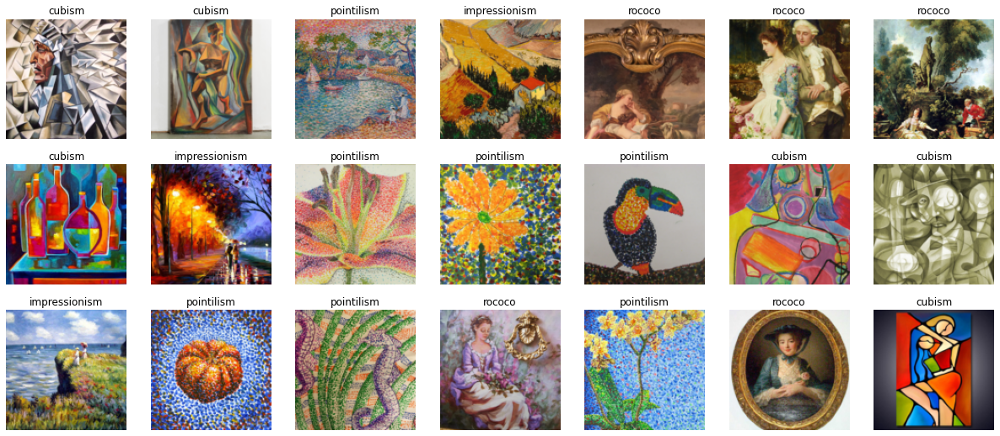

In [ ]:
# Show loaded validation set
dls.valid.show_batch(max_n=21, nrows=3)

In [ ]:
# Data augmentation: apply item and batch transform to create random variations of our input data
paintings = paintings.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms()
)
dls = paintings.dataloaders(path)

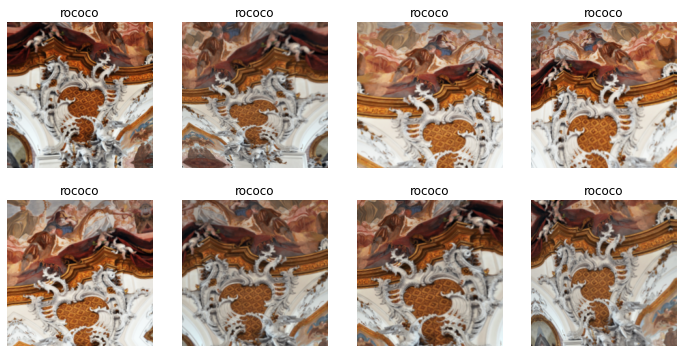

In [ ]:
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [ ]:
# Learn: apply transfer learning with ResNet-50 architecture
learn = cnn_learner(dls, resnet50, metrics=(error_rate, accuracy))
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.125180,0.952250,0.229358,0.770642,04:28


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.341487,0.214121,0.073394,0.926606,05:42
1,0.244560,0.195187,0.064220,0.935780,05:42
2,0.208905,0.094549,0.027523,0.972477,05:42
3,0.179278,0.056070,0.018349,0.981651,05:41


# 3. Plotting the results

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

## Sort images by Loss

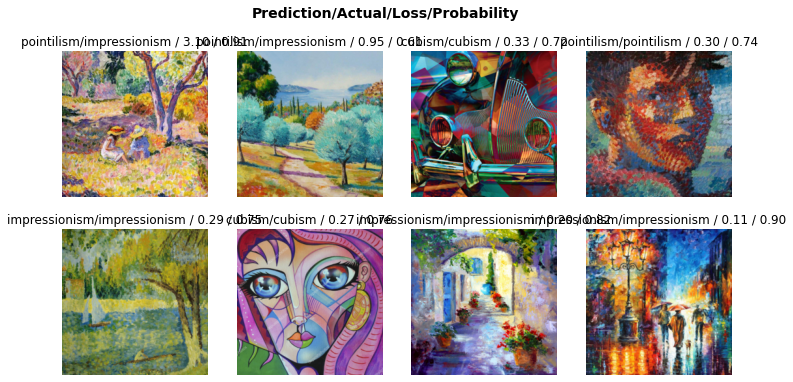

In [ ]:
interp.plot_top_losses(8, nrows=2)

## Confusion matrix

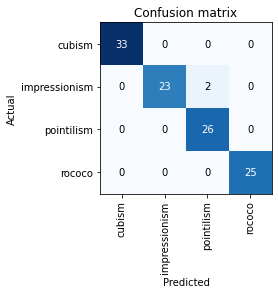

In [ ]:
interp.plot_confusion_matrix()

## Cleaning the dataset

In [ ]:
# fast.ai's GUI for cleaning the image dataset
cleaner = ImageClassifierCleaner(learn)

In [ ]:
cleaner

In [ ]:
from random import randint

In [ ]:
# Handle image deletion
for idx in cleaner.delete():
    # Figure out if the index is in train (0) or validation (1) dataset
    if Path(cleaner.fns[idx]) in cleaner.iwis[0].itemgot(0):
      involved_ds = 0
    else:
      involved_ds = 1
    # Keep all other images
    mask = array(cleaner.iwis[involved_ds].itemgot(0)) != Path(cleaner.fns[idx])
    updated_ds = cleaner.iwis[involved_ds][mask]
    
    # Change cleaner.iwis: needs to be a tuple with (updated train, valid) or (train, updated valid)
    cleaner.iwis = (updated_ds, cleaner.iwis[1]) if involved_ds == 0 else (cleaner.iwis[0], updated_ds)
    
    # Update the learner's dataset
    learn.dls[involved_ds].dataset = updated_ds
    
    # Remove the image both from the folder and fns
    cleaner.fns[idx].unlink()
    cleaner.fns.remove(cleaner.fns[idx])

# Handle image re-labelling
for idx,cat in cleaner.change(): 
    try:
        shutil.move(str(cleaner.fns[idx]), path/cat)
    except Exception as e:
        originalfn = str(cleaner.fns[idx]).split('/')[-1] 
        ext = originalfn.split('.')[-1]
        newFn = originalfn[:-len(ext)-1]
        shutil.move(Path(str(path/cat)+'/' +str(originalfn)), str(Path(str(path/cat) + ('/'+ newFn + '_'+str(randint(0,10000))+'.'+ext))))
        shutil.move(str(cleaner.fns[idx]), path/cat)

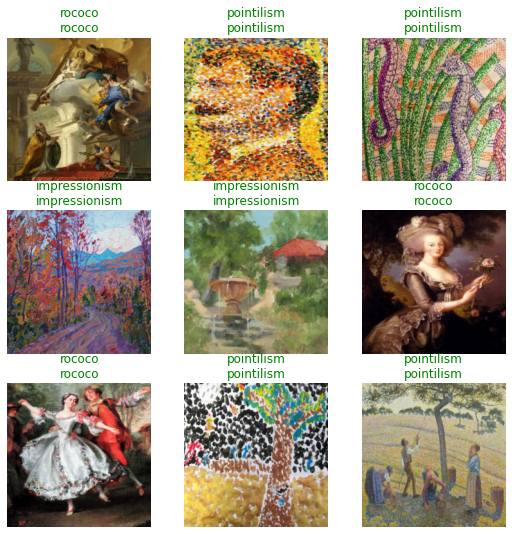

In [ ]:
# Show image data, its label and prediction
learn.show_results()

# 4. Exporting the model

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

# 5. Creating a notebook app from the model

## Creating GUI components

In [ ]:
# Create inference learner from the exported model
learn_inf = load_learner(path/'export.pkl')

In [ ]:
# Create 'Upload' button to input image
#hide_output
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [ ]:
# Get uploaded image
img = PILImage.create(btn_upload.data[-1])

In [ ]:
#hide_output
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(256, 256))
out_pl

Output()

In [ ]:
# Get predictions
pred, pred_idx, probs = learn_inf.predict(img)

In [ ]:
# Display predictions using label
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: cubism; Probability: 0.9844')

In [ ]:
# Create 'Classify' button to make prediction
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [ ]:
# Click event handler for 'Classify' button
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

## Finalising the notebook app

In [ ]:
#hide_output
VBox([widgets.Label('Upload a painting!'),
      btn_upload, btn_run, out_pl, lbl_pred])